# Audio Classification Using PyTorch 

### Import Libraries 

In [2]:
import os 
import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd 
import scipy.io 
import librosa 
import librosa.display 
import wave
from glob import glob  #for reading files 
import glob 
import pickle as pk
import csv 
import matplotlib.image as img

### Path to the Data 

In [3]:
"""set the path for the wav files within session within birds"""

path_bird = '/Users/ahmedabdalsattar/Desktop/z_r20y12_20/2020-08-12'
wave_files = glob.glob(os.path.join(path_bird,'*.wav'))
sampling_freq = 15000
n_fft = 2048
hop_length = 512

In [4]:
data = {"labels":[], 
        "path_spec":[],
        "time_length":[] }

### Time length of .wav files 

In [5]:
# we already implemnted this code below, but this just to show max,min and mean of wav files. 
def time_length(x):
    length_file_sec = []
    for i in range(len(wave_files)):
        signal,sr = librosa.load(x[i],sr=15000)
        time_period = librosa.get_duration(filename = wave_files[i])
        length_file_sec.append(time_period)
    return length_file_sec
time_length = time_length(wave_files)

# append data["time_length"] in the csv file column time_length 
data["time_length"].append(time_length)

### Spectrogram as .png 

<ipython-input-6-7781cdf5a33f>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8,8))


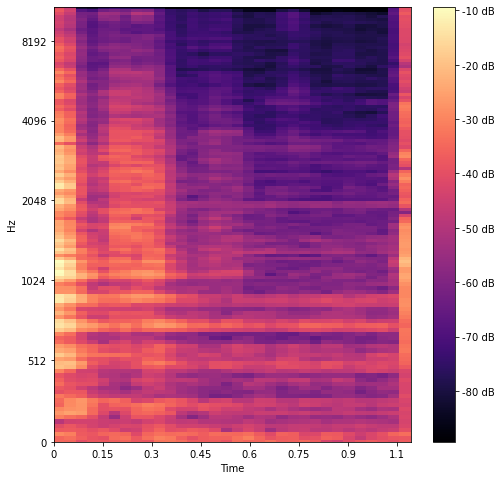

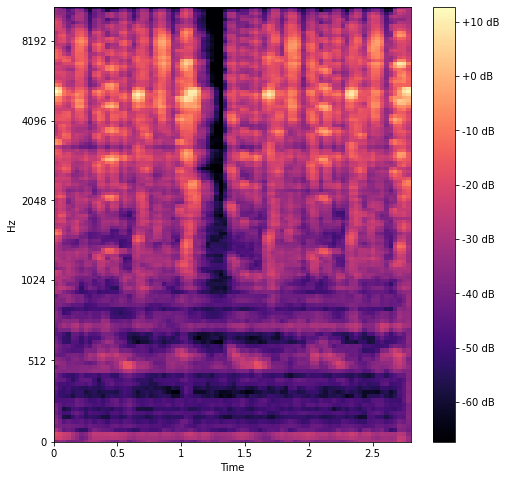

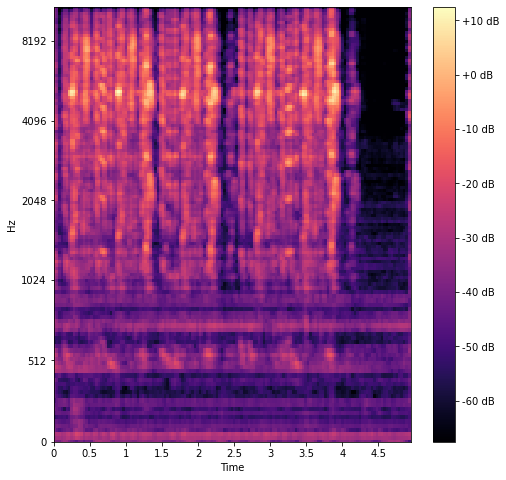

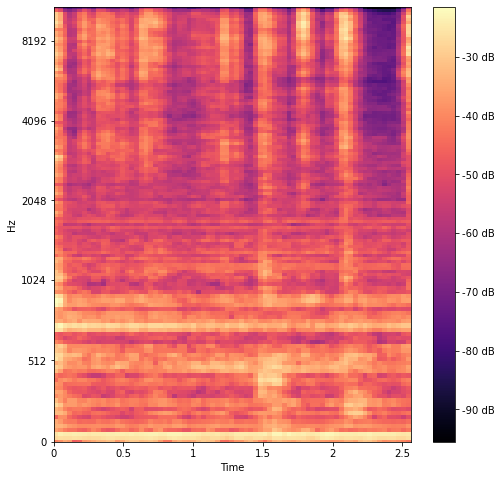

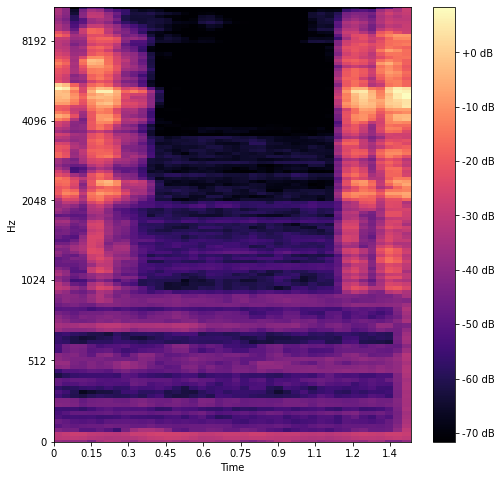

...

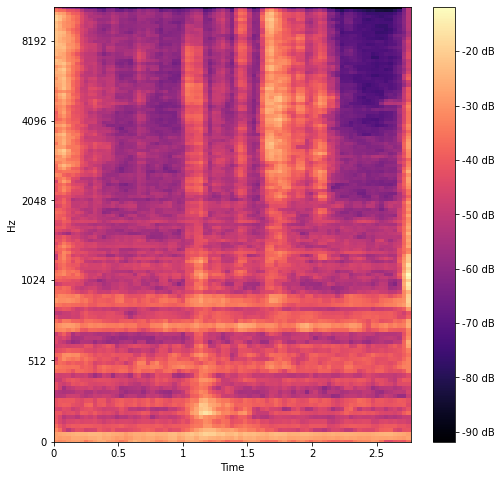

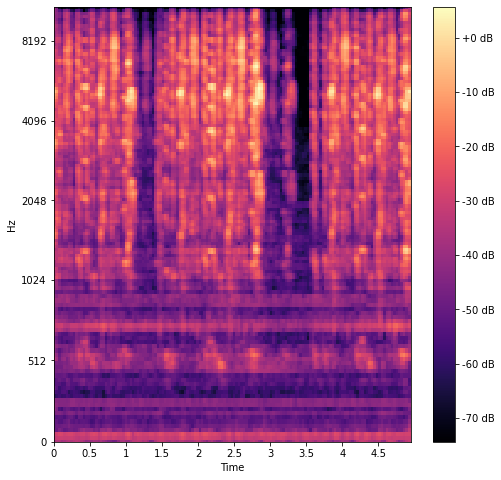

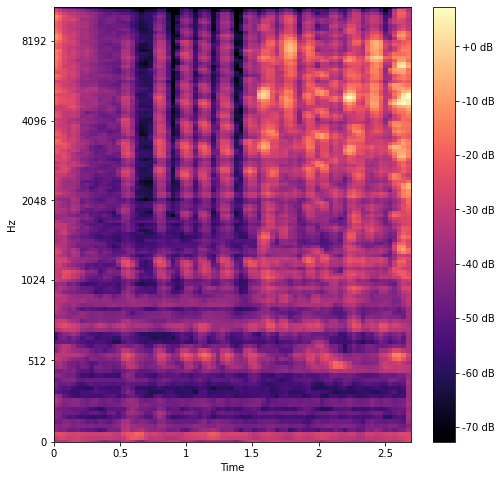

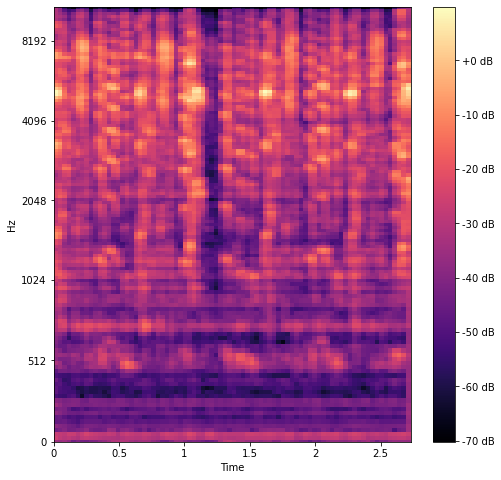

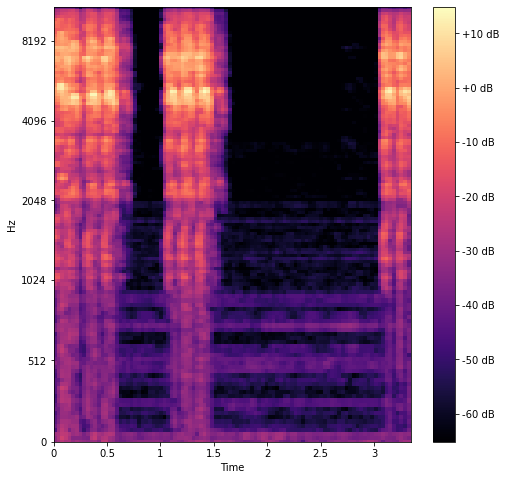

In [6]:
"""create a function that find the spectrogram and append the path of 
each spectrogram as one column and append it in column ["spec_path"]"""

# make sure the wave_files in order 

"""this function find the length of files and extract the first 1 sec of each file and save it as spectrogram mfcc in 
a folder"""
import numpy as np
import librosa
top_db = 80

for i in range(len(wave_files)):
    signal,sr = librosa.load(wave_files[i],sr=15000)
    mfcc_arrays = []
    plt.figure(figsize=(8,8))
    spec = librosa.feature.melspectrogram(signal,sr=sr,n_fft=n_fft,hop_length=hop_length)
    spec_db = librosa.power_to_db(spec,top_db=top_db)
    librosa.display.specshow(spec_db,sr=sr,hop_length=hop_length,x_axis='time',y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    path_spect = '/Users/ahmedabdalsattar/Desktop/spect_1sec/'
    a = os.path.splitext(wave_files[i])[0]
    name_img = os.path.basename(a)
    plt.savefig( path_spect + "{spe}".format(spe = name_img) + ".png")
    image_p = path_spect + "{spe}".format(spe = name_img) + ".png"
    data["path_spec"].append(image_p)
    mfcc_arrays.append(spec)
    
        
    
#     spec=librosa.feature.melspectrogram(wav, sr=sr, n_fft=n_fft,
#               hop_length=hop_length,n_mels=n_mels,fmin=fmin,fmax=fmax)


### Export spectrgoram .png files in a .csv file 

In [7]:
# path_img = []
# for i in range(len(wave_files)):
#     path_spect + "{spe}".format(spe = name_img) + ".png"  
#     path_img.append(path_files)
# data["path_spec"].append(path_img)

### Labels as .txt files 

In [8]:
"""for this function, i have to set a path for the folder where all labels are located
or find all the files that endwith .txt as it represent the labels
- for now the labels are all stored in one folder, include each .txt for each session"""

labels = []
path_labels = '/Users/ahmedabdalsattar/Desktop/labels/'

txt_files = os.listdir(path_labels)
labels = []
for file in range(len(txt_files)):
    path = os.path.join(path_labels,txt_files[file])
    a = os.path.basename(path[-1])
    if a == 't':
        x = open(path,"r")
        for line in x.readlines():
            for i in line.split():
                labels.append(int(i))
    else:
        pass
    
data["labels"].append(labels)

### Export Data In CSV file 

In [9]:
""" create a csv_file and append all the data that you found, each one 
for the column that is for it"""

path_name = '/Users/ahmedabdalsattar/Desktop/birdsong_file.csv'
with open(path_name,'w',newline='') as file:
    fieldnames = ["path_spec", "labels", "time_length"]
    writer = csv.DictWriter(file,fieldnames=fieldnames)
    writer.writeheader()
with open(path_name,'a',newline='') as file:
    writer = csv.writer(file)
    for i in range(len(time_length)):
        writer = csv.DictWriter(file,fieldnames=fieldnames)
        writer.writerow({'time_length':time_length[i],'labels':labels[i], 'path_spec':data["path_spec"][i]})
      


In [10]:
"""read the csv file and use pandas to read as Data Frame Table"""
# a function that reads a full row in csv file, which shows the path_spec, label, time_length
path_csv_file = '/Users/ahmedabdalsattar/Desktop/birdsong_file.csv'
with open (path_csv_file,newline='') as file:  
    reader = csv.reader(file)
    outer_list = []
    for row in reader:
        outer_list.append(row)


In [54]:
#Read/Import the data from .CSV file using Pandas Data Fram 
df = pd.read_csv(path_csv_file)
df.head()
#df.tail()


,path_spec,labels,time_length
0,/Users/ahmedabdalsattar/Desktop/spect_1sec/202...,1,1.085958
1,/Users/ahmedabdalsattar/Desktop/spect_1sec/202...,2,2.774812
2,/Users/ahmedabdalsattar/Desktop/spect_1sec/202...,0,4.947833
3,/Users/ahmedabdalsattar/Desktop/spect_1sec/202...,1,2.551104
4,/Users/ahmedabdalsattar/Desktop/spect_1sec/202...,1,1.407437


In [ ]:
# the value count shows you how many 0 or 1 or 2 are in the dataset. 
df['labels'].value_counts()

In [12]:
"""Function that remove any .wav file that its time_length is less than 1sec
"""
# time_sec = df.time_length
# df.path_spec
# # for i in range(len(time_sec)):
# #     if time_sec[i] < 1:

'Function that remove any .wav file that its time_length is less than 1sec\n'

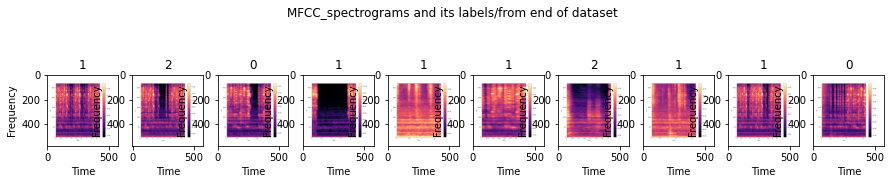

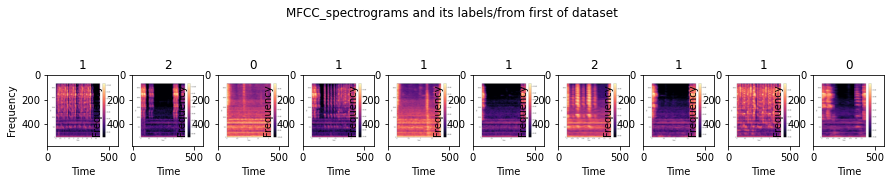

In [29]:
"""function that shows spectrograms with its labels as (titles)
"""

# show spectrogrmas data from the last 10 in the datasets. 
fig,ax = plt.subplots(1,10,figsize = (15,3))
for i,idx in enumerate(df[df['labels'] == 1]['path_spec'][-10:]):
    path = os.path.join(train_path,idx)
    ax[i].imshow(img.imread(path))
    ax[i].set_title(df["labels"][i])
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frequency")
    fig.suptitle("MFCC_spectrograms and its labels/from end of dataset")
  

# show spectrogrmas data from the first 10 in the datasets. 
fig,ax = plt.subplots(1,10,figsize = (15,3))
for i,idx in enumerate(df[df['labels']==0]['path_spec'][:10]):
    path = os.path.join(train_path,idx)
    a = ax[i].imshow(img.imread(path))
    ax[i].set_title(df["labels"][i])
    ax[i].set_xlabel("Time")
    ax[i].set_ylabel("Frequency")
    fig.suptitle("MFCC_spectrograms and its labels/from first of dataset")

plt.show()
    

In [50]:
"""find the mean and std for each function"""

# import PIL
# from PIL import Image
# print("version",PIL.__version__)
# # for i in range(len(df["path_spec"])):
# #     os.path.join


'find the mean and std for each function'

In [16]:
"""Function that finds the mean, std for RGB images"""

# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.image as img

# import numpy as np
# import matplotlib.pyplot as plt

# def imshow(image, ax=None, title=None, normalize=True):
#     if ax is None:
#         fig, ax = plt.subplots()
#     image = image.numpy().transpose((1, 2, 0))

#     if normalize:
#         mean = np.array([0.485, 0.456, 0.406])
#         std = np.array([0.229, 0.224, 0.225])
#         image = std * image + mean
#         image = np.clip(image, 0, 1)

#     ax.imshow(image)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.spines['left'].set_visible(False)
#     ax.spines['bottom'].set_visible(False)
#     ax.tick_params(axis='both', length=0)
#     ax.set_xticklabels('')
#     ax.set_yticklabels('')

#     return ax

In [129]:
import pandas as pd 
import matplotlib.pyplot as plt 
import torch
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split



class CactiDataset(Dataset):
    def __init__(self, data, path , transform = None):
        super().__init__()
        self.data = data.values
        self.path = path
        self.transform = transform
        
    # this return the length of the dataset 
    def __len__(self):
        return len(self.data)
    
    # getitem method that gets an element from 
    # the dataset at a specific index location within the dataset  
    def __getitem__(self,index):
        img_name,label = self.data[index]
        img_path = os.path.join(self.path, img_name)
        image = img.imread(img_path)
        if self.transform is not None:
            image = self.transform(image)
        return image, label

In [130]:

train_transform = transforms.Compose([transforms.ToPILImage(),
                                      transforms.ToTensor()]
                                      )

test_transform = transforms.Compose([transforms.ToPILImage(),
                                     transforms.ToTensor()]
                                     )

valid_transform = transforms.Compose([transforms.ToPILImage(),
                                     transforms.ToTensor()]
                                    )

In [131]:
"""split the data into three train, test and validations(optional)
- labels (y_test) data was stratified to make sure data are included
in every class"""

# valid is the test data 
train,valid_data = train_test_split(df,stratify=df.labels, test_size=0.2)


In [132]:
"""train:          training data 
   train_path      
   train_transofrm """
train_path = r'/Users/ahmedabdalsattar/Desktop/spect_1sec'

train_data = CactiDataset(train, train_path,train_transform)
valid_data = CactiDataset(valid_data,train_path,valid_transform)
# test_data = CactiDataset(submission,test_path,test_transforms)

In [134]:
num_epochs = 35
num_classes = 2
batch_size = 25
learning_rate = 0.001

In [135]:
train_loader = DataLoader(dataset = train_data, batch_size = batch_size, shuffle=True, num_workers=0)
valid_loader = DataLoader(dataset = valid_data,batch_size = batch_size, shuffle=False,num_workers=0)

In [136]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNN(nn.Module): 
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=10, kernel_size=3)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=3)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(720, 1024)
        self.fc2 = nn.Linear(1024, 2)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(x.shape[0],-1)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return x

In [137]:
model = CNN()
print(model)

CNN(
  (conv1): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
  (conv2_drop): Dropout2d(p=0.5, inplace=False)
  (fc1): Linear(in_features=720, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=2, bias=True)
)


In [138]:
device = ("cuda" if torch.cuda.is_available() else "cpu")

In [140]:
model = CNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)